Imports

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import librosa
from IPython.display import display, Audio
import soundfile as sf
from setup import device, train_test_split_path, get_features
import torchaudio
import torch

genres = ['blues', 'classical', 'country', 'disco', 'hiphop', 'jazz', 'metal', 'pop', 'reggae', 'rock']

Usando dispositivo: cuda


In [2]:
for id, genre in enumerate(genres):
    for i in range(100):
        try:
            x, sr = sf.read(f'../Data/genres_original/{genre}/{genre}.000{i:02}.wav')
        except RuntimeError as e:
            print("No se pudo leer con soundfile:", e)

No se pudo leer con soundfile: Error opening '../Data/genres_original/jazz/jazz.00054.wav': Format not recognised.


In [3]:
lens = []
durations = []
srs = []
for id, genre in enumerate(genres):
    for i in range(100):
        if not (i == 54 and genre == 'jazz'):
            x, sr = sf.read(f'../Data/genres_original/{genre}/{genre}.000{i:02}.wav')
            lens.append(len(x))
            durations.append(len(x)/sr)
            srs.append(sr)
pd.DataFrame(np.array([lens, durations, srs]).T, columns=['lens', 'durations', 'srs']).describe()

,lens,durations,srs
count,999.000000,999.000000,999.0
mean,662030.764765,30.024071,22050.0
std,1784.965742,0.080951,0.0
min,660000.000000,29.931973,22050.0
25%,661504.000000,30.000181,22050.0
50%,661794.000000,30.013333,22050.0
75%,661794.000000,30.013333,22050.0
max,675808.000000,30.648889,22050.0


Frecuencia de muestreo: 22050
Duración de la señal: 30.013333333333332


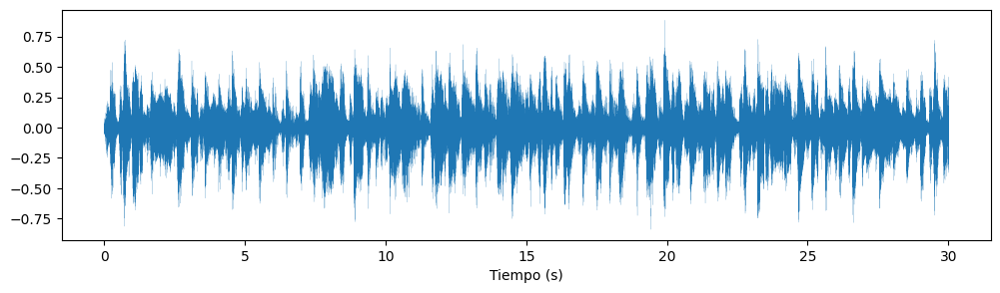

In [4]:
x, sr = sf.read('../Data/genres_original/blues/blues.00000.wav')
print("Frecuencia de muestreo:",sr)
print("Duración de la señal:",len(x)/sr)

t = np.arange(len(x)) / sr
plt.figure(figsize=(12, 3))
plt.plot(t, x, lw=0.1)  # use 'lw' (linewidth) instead of 'wh'
plt.xlabel('Tiempo (s)')

Audio(x, rate=sr)

Frecuencia de muestreo: 22050
Duración de la señal: 30.00018140589569


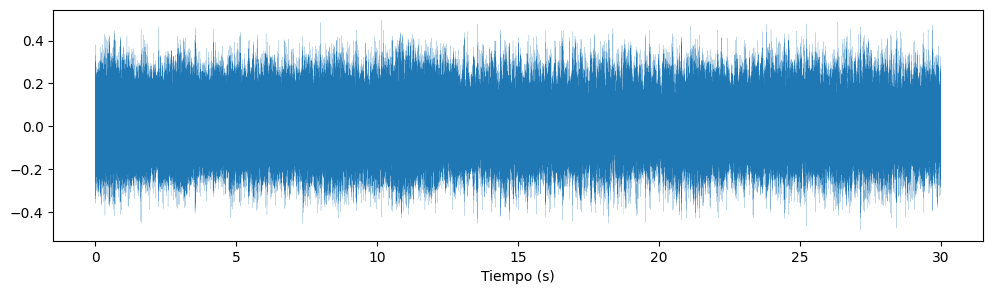

In [5]:
x, sr = sf.read('../Data/genres_original/metal/metal.00000.wav')
print("Frecuencia de muestreo:",sr)
print("Duración de la señal:",len(x)/sr)

t = np.arange(len(x)) / sr
plt.figure(figsize=(12, 3))
plt.plot(t, x, lw=0.1)  # use 'lw' (linewidth) instead of 'wh'
plt.xlabel('Tiempo (s)')

Audio(x, rate=sr)

Frecuencia de muestreo: 22050
Duración de la señal: 30.013333333333332


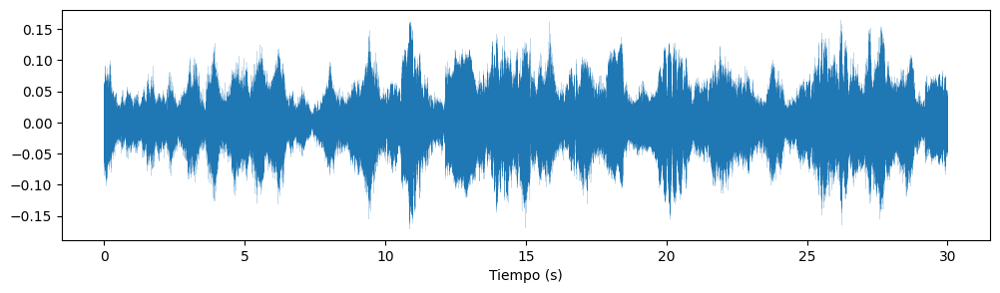

In [6]:
x, sr = sf.read('../Data/genres_original/classical/classical.00001.wav')
print("Frecuencia de muestreo:",sr)
print("Duración de la señal:",len(x)/sr)

t = np.arange(len(x)) / sr
plt.figure(figsize=(12, 3))
plt.plot(t, x, lw=0.1)  # use 'lw' (linewidth) instead of 'wh'
plt.xlabel('Tiempo (s)')

Audio(x, rate=sr)

## Posibles atributos

### Mel espectrograma

(80, 2308)


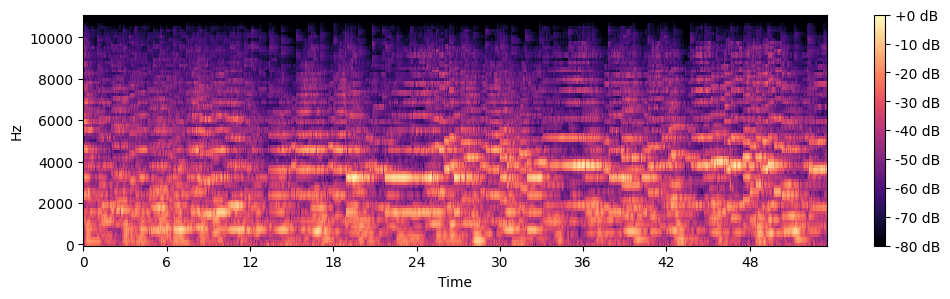

In [7]:
hop_length = int(sr * 0.013)  # 10 ms hop length
win_length = int(sr * 0.025)  # 30 ms window length

melspec = librosa.feature.melspectrogram(y=x[:660000], sr=sr, hop_length=hop_length, win_length=win_length, n_mels=80)
melspec_db = librosa.power_to_db(melspec, ref=np.max)
fig, ax = plt.subplots(figsize=(12, 3))

img = librosa.display.specshow(melspec_db, sr=sr, x_axis='time', y_axis='linear', ax=ax)
fig.colorbar(img, ax=ax, format="%+2.0f dB")
print(melspec.shape)

### MFCCs + Delta + Delta-Delta
MFCCs con sus primeras y segundas derivadas

In [8]:
int(sr * 0.025)

551

(60, 1292)


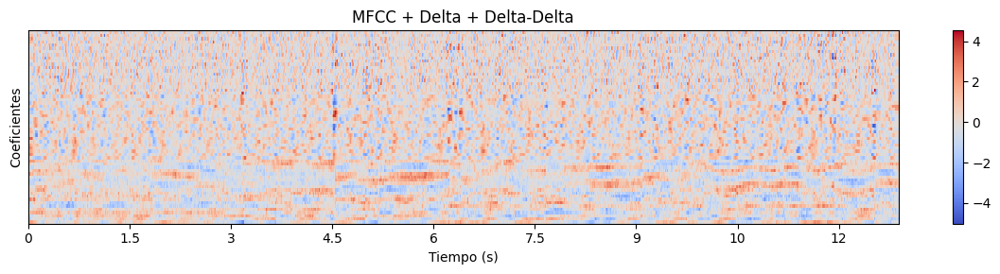

In [9]:
hop_length = int(sr * 0.01)  # 10 ms hop length
win_length = int(sr * 0.025)  # 30 ms window length

mfcc = librosa.feature.mfcc(y = x, sr=sr, n_mfcc=20, n_fft=win_length, n_mels=128, dct_type=2, norm='ortho', center=False)
mfcc_delta = librosa.feature.delta(mfcc, order=1)
mfcc_delta_delta = librosa.feature.delta(mfcc, order=2)
mfcc_combined = np.concatenate((mfcc, mfcc_delta, mfcc_delta_delta), axis=0)
mfcc_combined_norm = (mfcc_combined - np.mean(mfcc_combined, axis=1, keepdims=True)) / np.std(mfcc_combined, axis=1, keepdims=True)
print(mfcc_combined_norm.shape)

plt.figure(figsize=(12, 3))
librosa.display.specshow(mfcc_combined_norm, x_axis='time', sr=sr, hop_length=hop_length);
plt.xlabel('Tiempo (s)')
plt.ylabel('Coeficientes')
plt.title('MFCC + Delta + Delta-Delta')
plt.colorbar()
plt.tight_layout()
plt.show()

### Constant-Q power spectrum
https://arxiv.org/abs/2505.04451

(84, 1293)


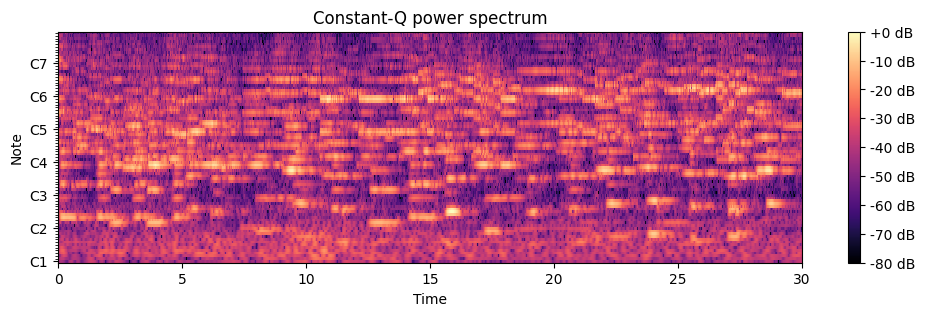

In [10]:
C = np.abs(librosa.cqt(x, sr=sr))
C_db = librosa.amplitude_to_db(C, ref=np.max)
fig, ax = plt.subplots(figsize=(12, 3))
img = librosa.display.specshow(C_db, sr=sr, x_axis='time', y_axis='cqt_note', ax=ax)
ax.set_title('Constant-Q power spectrum')
fig.colorbar(img, ax=ax, format="%+2.0f dB")
print(C.shape)

### Wav2Vec2Bundle

In [11]:
bundle = torchaudio.pipelines.HUBERT_BASE
model = bundle.get_model().to(device)

Frecuencia de muestreo: 22050
Duración de la señal: 30.013333333333332
Layer 0: torch.Size([1, 1500, 768])
Layer 1: torch.Size([1, 1500, 768])
Layer 2: torch.Size([1, 1500, 768])
Layer 3: torch.Size([1, 1500, 768])
Layer 4: torch.Size([1, 1500, 768])
Layer 5: torch.Size([1, 1500, 768])
Layer 6: torch.Size([1, 1500, 768])
Layer 7: torch.Size([1, 1500, 768])
Layer 8: torch.Size([1, 1500, 768])
Layer 9: torch.Size([1, 1500, 768])
Layer 10: torch.Size([1, 1500, 768])
Layer 11: torch.Size([1, 1500, 768])


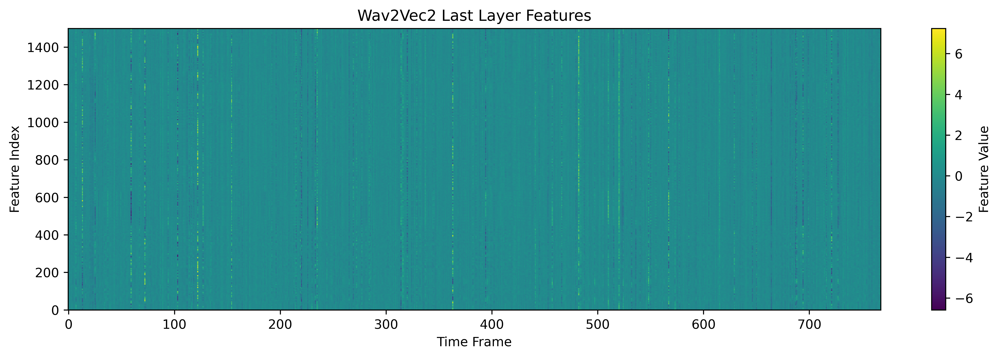

In [12]:
x, sr = sf.read('../Data/genres_original/classical/classical.00002.wav')
print("Frecuencia de muestreo:",sr)
print("Duración de la señal:",len(x)/sr)
x = torch.tensor(x, dtype=torch.float32).to(device)
waveform = torchaudio.functional.resample(x, sr, bundle.sample_rate)

model.eval()
with torch.inference_mode():
    features, _ = model.extract_features(waveform.unsqueeze(0))

# features is a list of tensors, print the shape of each tensor (layer)
for i, f in enumerate(features):
	print(f"Layer {i}: {f.shape}")

last_layer_features = features[-1].squeeze().detach().cpu().numpy()

plt.figure(figsize=(12, 4), dpi=600)
plt.imshow(last_layer_features, aspect='auto', origin='lower', interpolation='nearest')
plt.colorbar(label='Feature Value')
plt.xlabel('Time Frame')
plt.ylabel('Feature Index')
plt.title('Wav2Vec2 Last Layer Features')
plt.tight_layout()
plt.show()

del model

los ejes estan alreves

## Crea y guarda en \Data las features

In [14]:
X_train_path, X_test_path, X_eval_path, y_train, y_test, y_eval = train_test_split_path()

MAX_LEN = 660000
SR = 22050
HOP_LENGTH = int(SR * 0.01)  # 10 ms hop length
WIN_LENGTH = int(SR * 0.025)  # 30 ms window length

for feature_name in ['mel', 'mfcc', 'cqt', 'wav2vec2']:
    for paths, name in zip([X_train_path, X_test_path, X_eval_path], ['X_train', 'X_test', 'X_eval']):
        X = get_features(paths, feature_name = feature_name, sr=SR, max_len=MAX_LEN, hop_length=HOP_LENGTH, win_length=WIN_LENGTH)
        np.save(f'../Data/{name}_{feature_name}.npy', X)
        
        print(f"Guardado {name} con {feature_name} en ../Data/{name}_{feature_name}.npy")
        print(f"Elementos:", len(X))
        print(f"Primer elemento:", X[0].shape)
        print('-' * 50)


Guardado X_train con mel en ../Data/X_train_mel.npy
Elementos: 719
Primer elemento: (80, 3001)
--------------------------------------------------
Guardado X_test con mel en ../Data/X_test_mel.npy
Elementos: 180
Primer elemento: (80, 3001)
--------------------------------------------------
Guardado X_eval con mel en ../Data/X_eval_mel.npy
Elementos: 100
Primer elemento: (80, 3001)
--------------------------------------------------
Guardado X_train con mfcc en ../Data/X_train_mfcc.npy
Elementos: 719
Primer elemento: (60, 1288)
--------------------------------------------------
Guardado X_test con mfcc en ../Data/X_test_mfcc.npy
Elementos: 180
Primer elemento: (60, 1288)
--------------------------------------------------
Guardado X_eval con mfcc en ../Data/X_eval_mfcc.npy
Elementos: 100
Primer elemento: (60, 1288)
--------------------------------------------------
Guardado X_train con cqt en ../Data/X_train_cqt.npy
Elementos: 719
Primer elemento: (84, 1290)
-------------------------------

## Acerca de wav2vec2
wav2vec 2.0 fue entrenado con audio de habla por lo que se espera una performance pobre para manejar musica

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from setup import train_test_split_path

_, _, _, y_train, _, _ = train_test_split_path()

X_train_wav2vec2 = np.load('../Data/X_train_wav2vec2.npy') 

print(f"Entrenamiento: {len(X_train_wav2vec2)} pares")
print(f"Primer elemento: {X_train_wav2vec2[0].shape}")

# Flatten each sample for PCA
X_train_wav2vec2 = np.array([x.T.flatten() for x in X_train_wav2vec2])
print(f"Primer elemento: {X_train_wav2vec2[0].shape}")

Usando dispositivo: cuda
Entrenamiento: 719 pares
Primer elemento: (1496, 768)
Primer elemento: (1148928,)


In [3]:
# PCA decomposition en 3D
from sklearn.decomposition import PCA
from mpl_toolkits.mplot3d import Axes3D
from ipywidgets import interact
import ipywidgets as widgets

pca_3d = PCA(n_components=3)
x_train_pca_3d = pca_3d.fit_transform(X_train_wav2vec2)

def update_view(elev, azim):
    fig = plt.figure(figsize=(7, 7), dpi=100)
    ax = fig.add_subplot(111, projection='3d')
    scatter = ax.scatter(
        x_train_pca_3d[:, 0], x_train_pca_3d[:, 1], x_train_pca_3d[:, 2],
        c=y_train, cmap='viridis', alpha=0.7
    )
    fig.colorbar(scatter, ax=ax, label='Target')
    ax.set_title("PCA Decomposition (3D) of x_desarrollo")
    ax.set_xlabel("Principal Component 1")
    ax.set_ylabel("Principal Component 2")
    ax.set_zlabel("Principal Component 3")
    ax.view_init(elev=elev, azim=azim)
    plt.tight_layout()
    plt.show()

# Sliders
elev_slider = widgets.FloatSlider(value=30, min=0, max=90, step=1, description='Elev:')
azim_slider = widgets.FloatSlider(value=30, min=0, max=360, step=1, description='Azim:')

# Interactive plot
interact(update_view, elev=elev_slider, azim=azim_slider)

interactive(children=(FloatSlider(value=30.0, description='Elev:', max=90.0, step=1.0), FloatSlider(value=30.0…

<function __main__.update_view(elev, azim)>

c:\Users\aaron\AppData\Local\Programs\Python\Python312\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


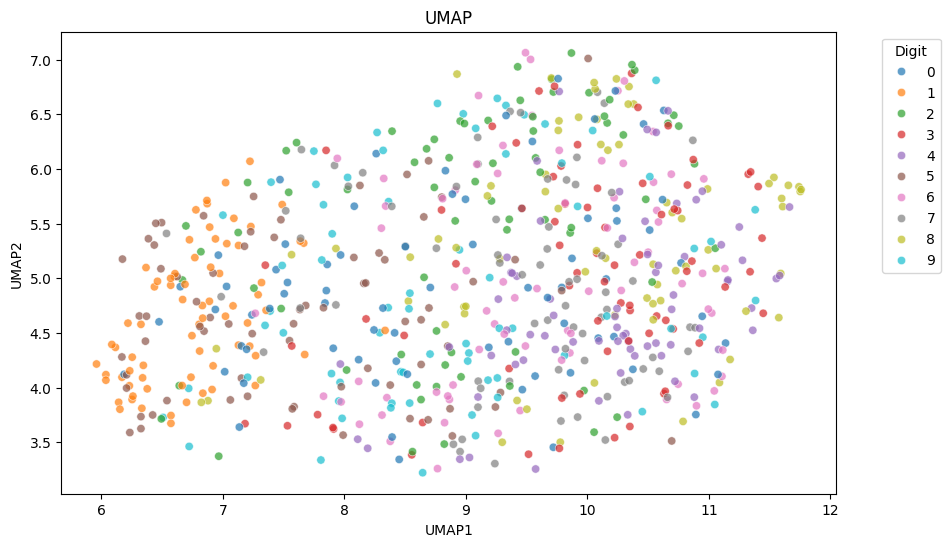

In [2]:
import umap.umap_ as umap
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_train_wav2vec2)
umap_reducer = umap.UMAP(n_components=2, random_state=42)
X_umap = umap_reducer.fit_transform(X_scaled)
df = pd.DataFrame(X_umap, columns=["UMAP1", "UMAP2"])
df["label"] = y_train  # Add labels
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x="UMAP1", y="UMAP2", hue="label", palette="tab10", alpha=0.7)
plt.title("UMAP")
plt.legend(title="Digit", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.show()

### plots

In [41]:
from setup import device, train_test_split_path, Image_dataset, get_data_max
import numpy as np
import matplotlib.pyplot as plt
import librosa
from IPython.display import display, Audio
import soundfile as sf
import torch
import gc

genres = ['blues', 'classical', 'country', 'disco', 'hiphop', 'jazz', 'metal', 'pop', 'reggae', 'rock']

IDX = 59
MAX_LEN = 660000
SR = 22050
HOP_LENGTH = int(SR * 0.01)  # 10 ms hop length
WIN_LENGTH = int(SR * 0.025)  # 30 ms window length

X_train_path, _, _, y_train, _, _ = train_test_split_path()
x, sr = sf.read(X_train_path[IDX])
x = x[:MAX_LEN]
print("Frecuencia de muestreo:",sr)
print("Duración de la señal:",len(x)/sr)
Audio(x, rate=sr)

Frecuencia de muestreo: 22050
Duración de la señal: 29.931972789115648


Entrenamiento: 719 pares
Testeo: 180 pares
--------------------------------------------------
Primer elemento del dataset de entrenamiento: {'input': tensor([[-23.8628,  -9.3174,  -6.4540,  ..., -73.3293, -65.8977, -54.4696],
        [-22.0908,  -4.1262,  -3.4861,  ..., -66.0889, -62.7450, -53.7704],
        [-25.7104,  -4.2807,  -6.4059,  ..., -63.6177, -62.2644, -51.5204],
        ...,
        [-80.0000, -67.7903, -60.2403,  ..., -80.0000, -80.0000, -76.8562],
        [-80.0000, -76.9833, -68.9733,  ..., -80.0000, -80.0000, -76.2964],
        [-80.0000, -80.0000, -80.0000,  ..., -80.0000, -80.0000, -76.2242]],
       device='cuda:0'), 'target': tensor([0., 0., 0., 0., 0., 0., 0., 0., 1., 0.], device='cuda:0'), 'input_length': (80, 3001), 'target_length': 10}
--------------------------------------------------
Entrenamiento: 719 pares
Testeo: 180 pares
--------------------------------------------------
Primer elemento del dataset de entrenamiento: {'input': tensor([[-28.6540, -27.9601,

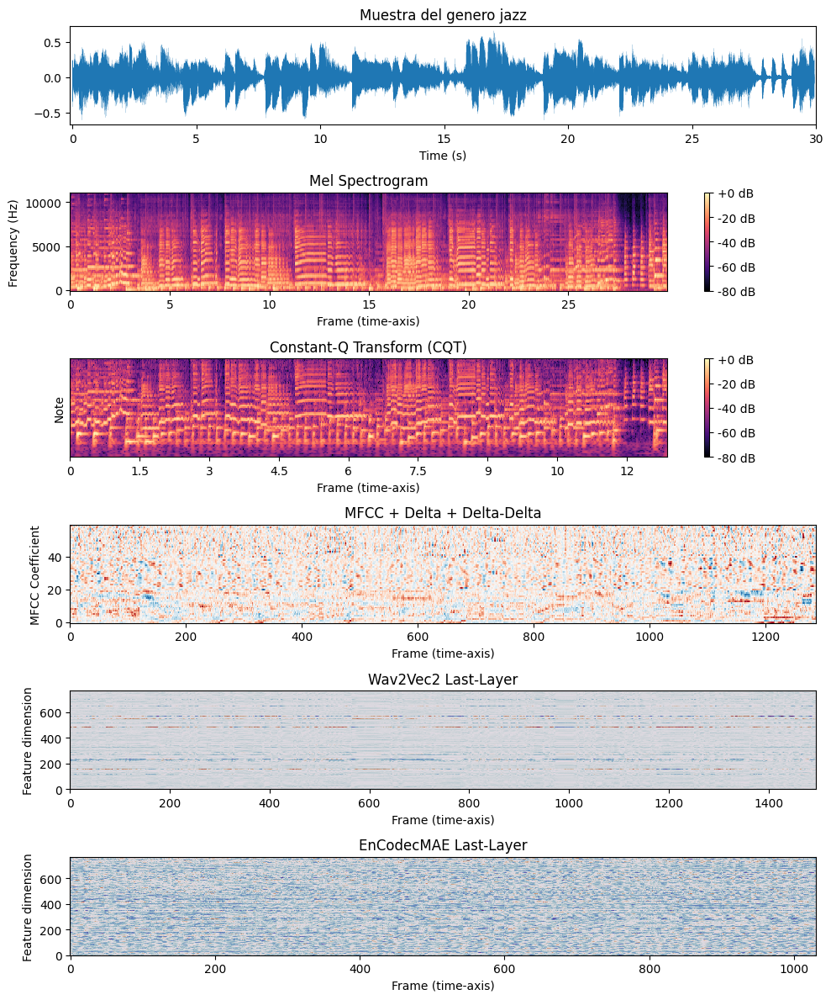

19851

In [51]:
import librosa.display

FEATURES = ['mel', 'cqt', 'mfcc', 'wav2vec2', 'EnCodecMAE']

# Mapping for librosa's y_axis parameter (None means use imshow)
y_axis_opts = {
    'mel': 'linear',
    'cqt': 'cqt_note',
    'mfcc': None,
    'wav2vec2': None,
    'EnCodecMAE': None,
}

# Human-friendly titles and axis labels
titles = {
    'mel': 'Mel Spectrogram',
    'cqt': 'Constant-Q Transform (CQT)',
    'mfcc': 'MFCC + Delta + Delta-Delta',
    'wav2vec2': 'Wav2Vec2 Last-Layer',
    'EnCodecMAE': 'EnCodecMAE Last-Layer',
}
xlabels = {feat: 'Frame (time-axis)' for feat in FEATURES}

ylabels = {
    'mel': 'Frequency (Hz)',
    'cqt': 'Note',
    'mfcc': 'MFCC Coefficient',
    'wav2vec2': 'Feature dimension',
    'EnCodecMAE': 'Feature dimension',
}

cmaps = {
    'mel': None,
    'cqt': None,
    'mfcc': 'RdBu',
    'wav2vec2': 'twilight_shifted',
    'EnCodecMAE': 'twilight_shifted',
}

fig, axes = plt.subplots(len(FEATURES)+1, 1, figsize=(10, 2 * (len(FEATURES)+1)))

t = np.arange(len(x)) / sr
axes[0].plot(t, x, lw=0.1)  # use 'lw' (linewidth) instead of 'wh'
axes[0].set_title(f'Muestra del genero {genres[y_train[IDX]]}')
axes[0].set_xlabel('Time (s)')
axes[0].set_xlim(-0.1,30)

for ax, feat in zip(axes[1:], FEATURES):
    # Load data
    train_ds, _ = get_data_max(feat, Image_dataset)
    matrix = train_ds[IDX]['input'].cpu().numpy()

    # Display with specshow or imshow
    if y_axis_opts[feat] is not None:
        img = librosa.display.specshow(
            matrix,
            sr=sr,
            hop_length=HOP_LENGTH,
            x_axis='time',
            y_axis=y_axis_opts[feat],
            ax=ax
        )
        fig.colorbar(img, ax=ax, format="%+2.0f dB")
    else:
        img = ax.imshow(
            matrix,
            aspect='auto',
            origin='lower',
            interpolation='nearest',
            cmap=cmaps[feat]
        )

    # Titles, labels, colorbar
    ax.set_title(titles[feat])
    ax.set_xlabel(xlabels[feat])
    ax.set_ylabel(ylabels[feat])
    
# Layout & cleanup
plt.tight_layout()
plt.show()

# Free up memory
del train_ds
torch.cuda.empty_cache()
gc.collect()